0it [00:00, ?it/s]

204 friends found


204it [01:06,  3.07it/s]


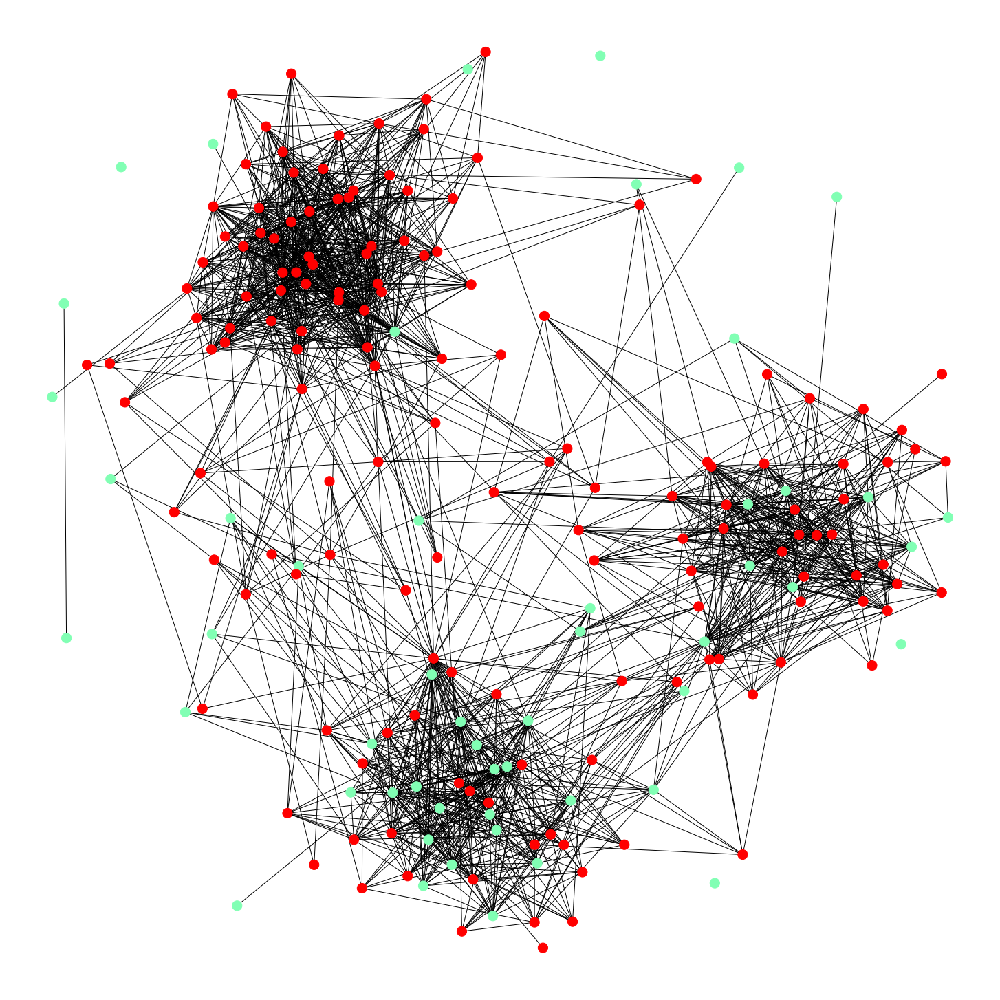

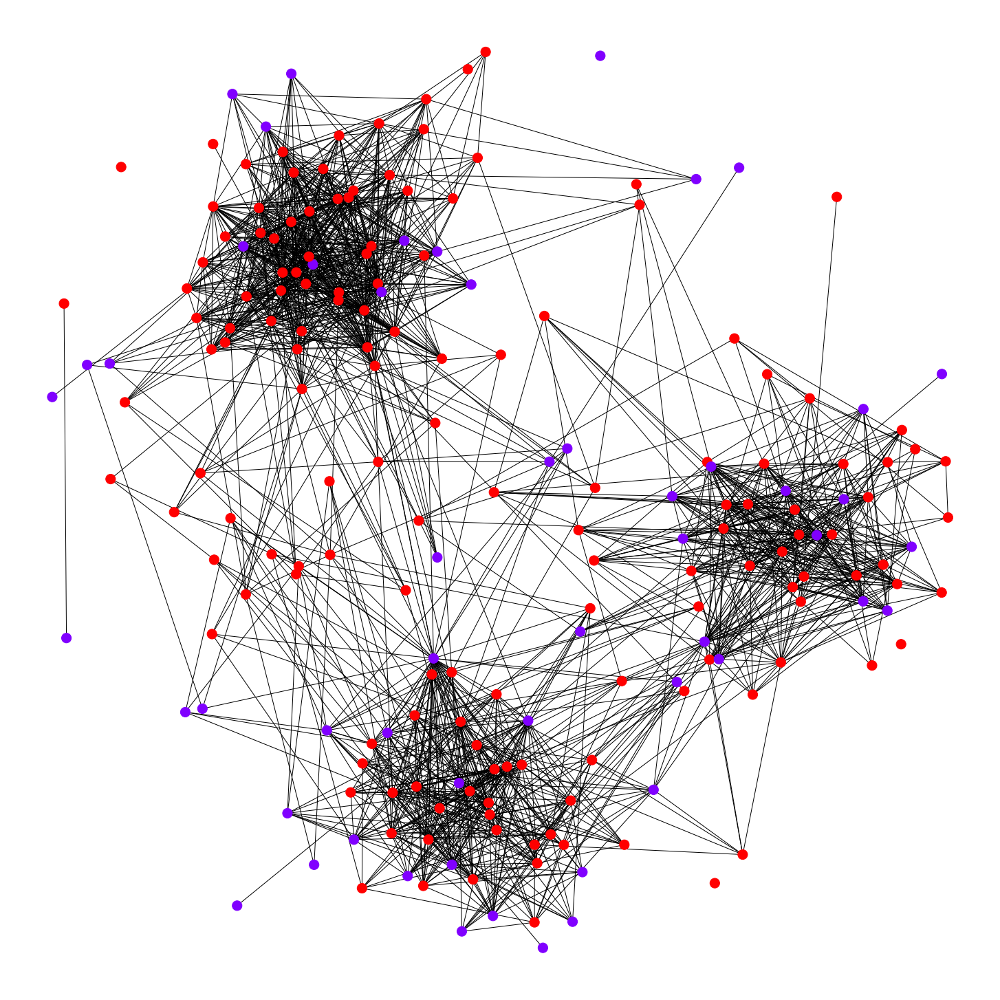

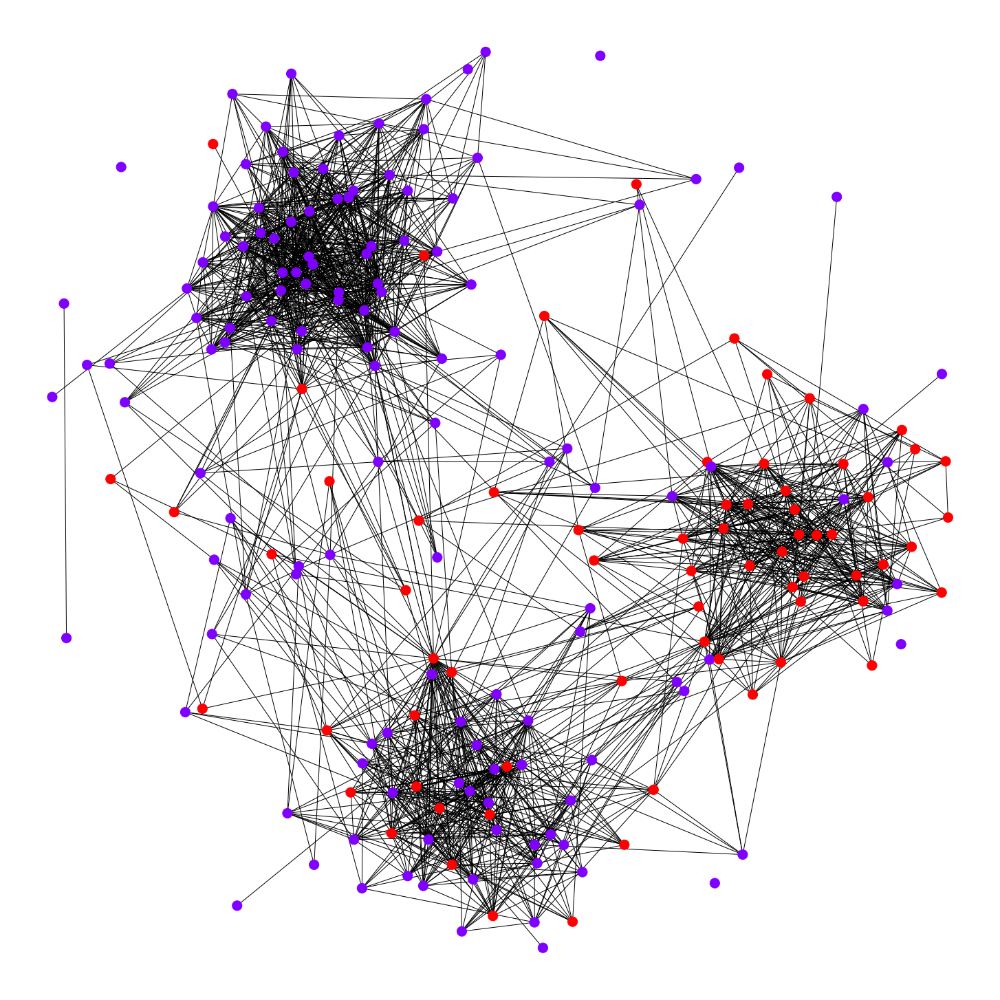

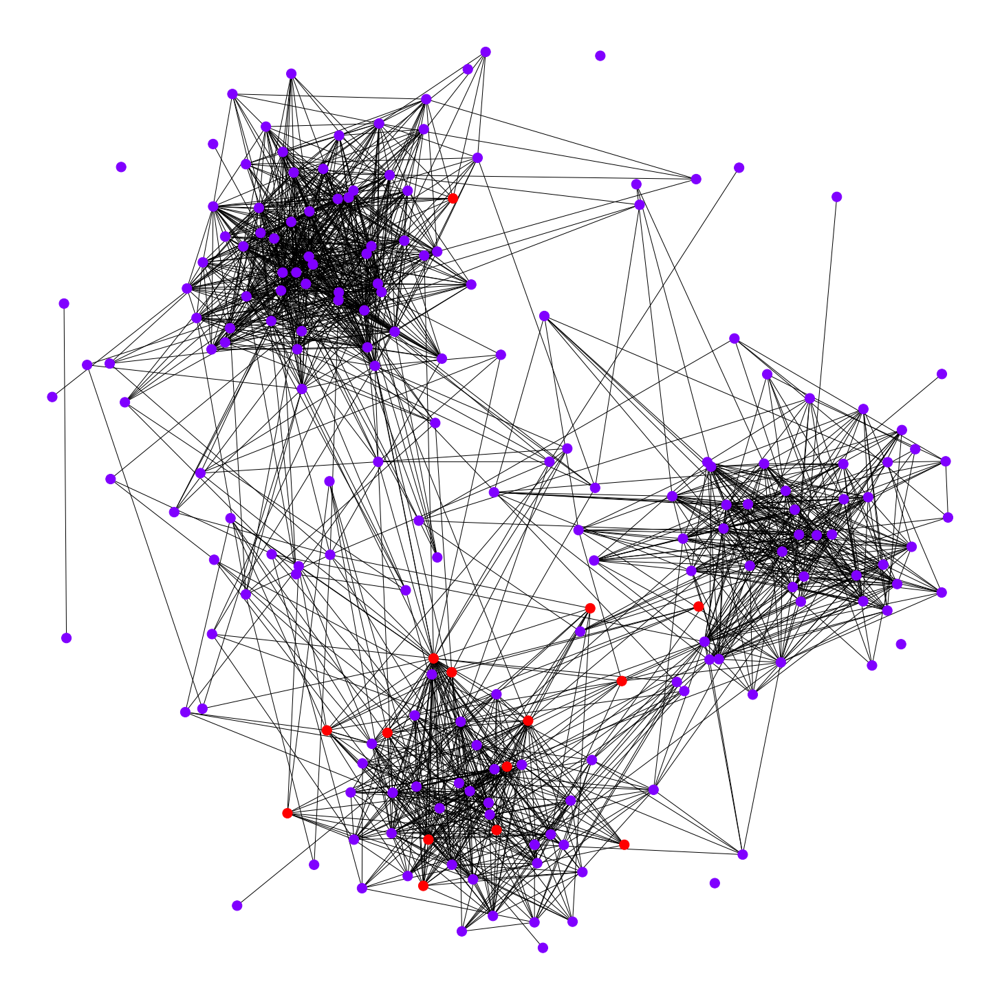

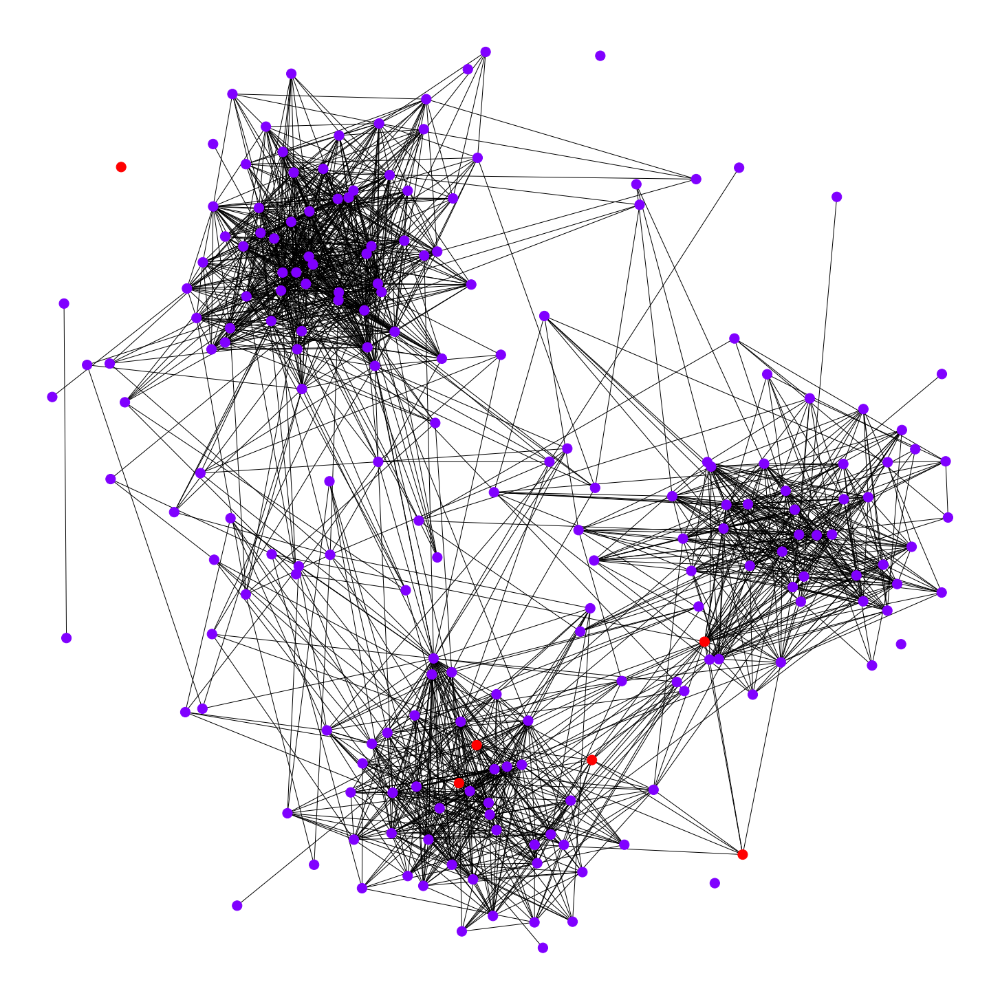

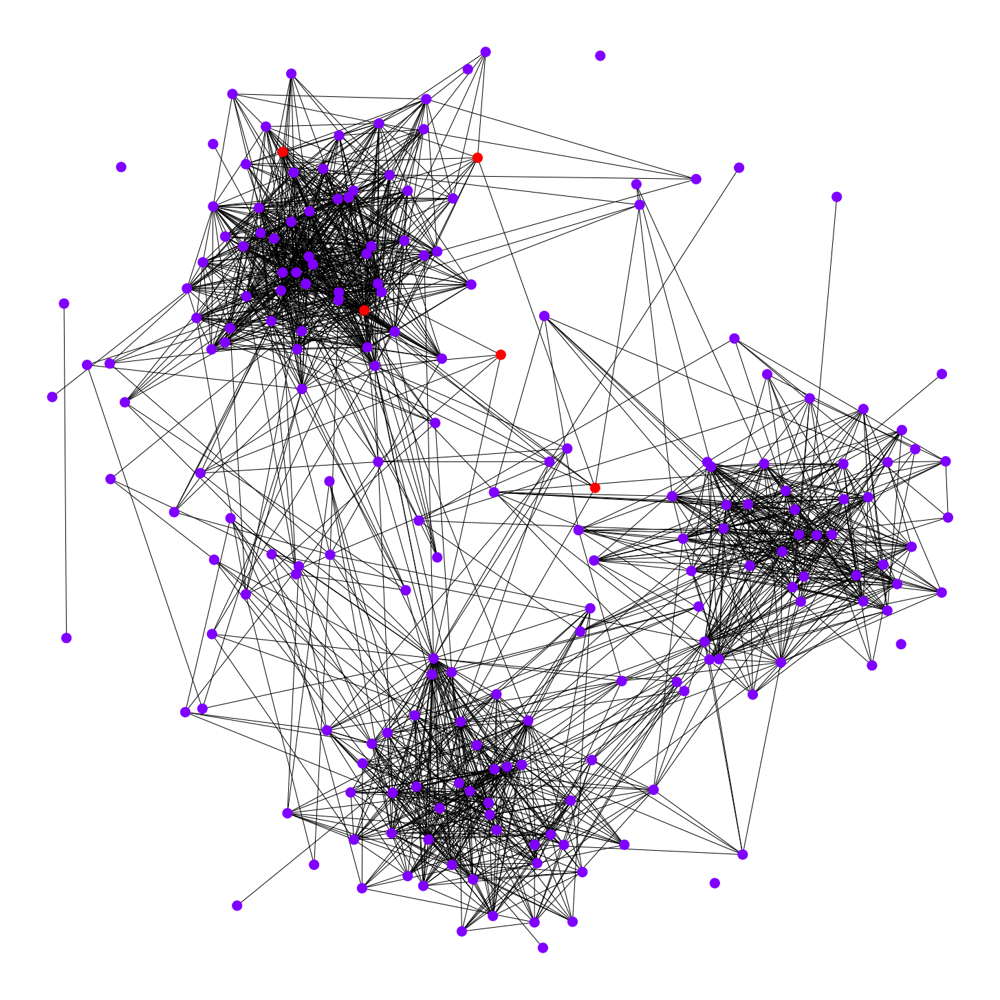

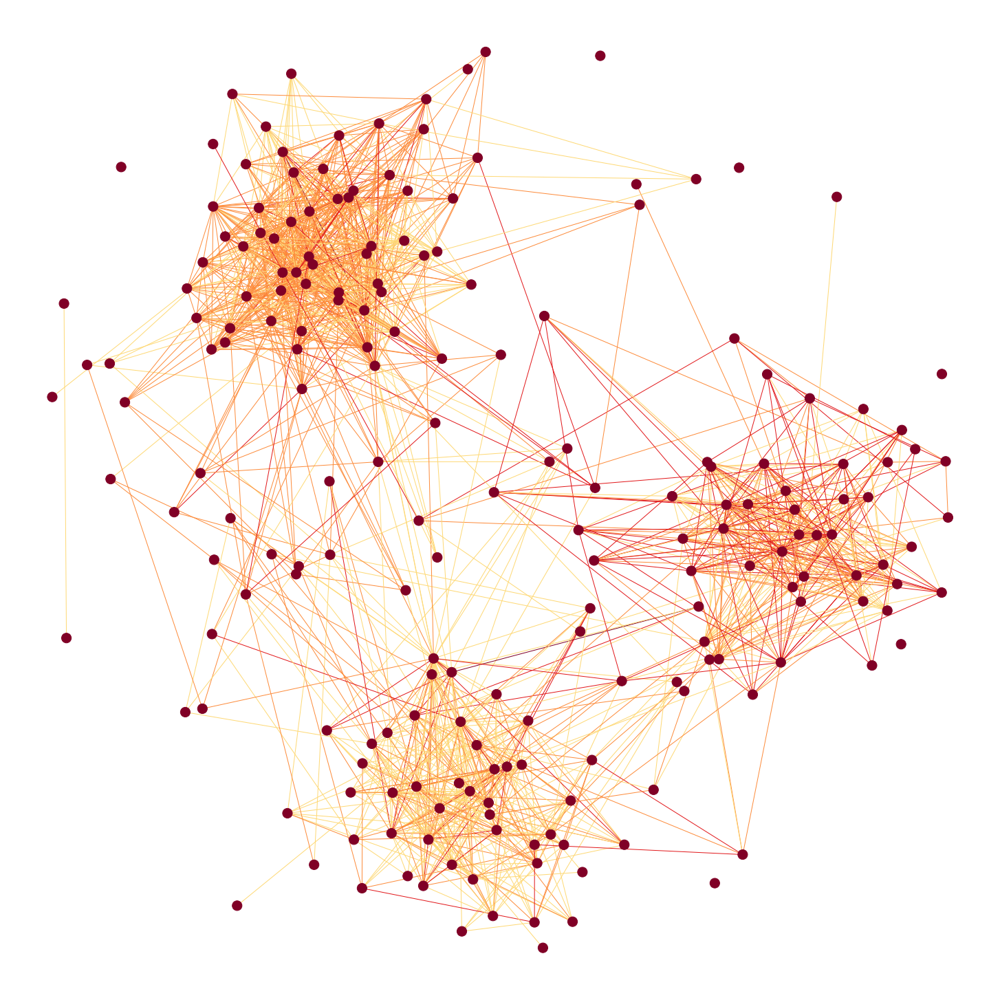

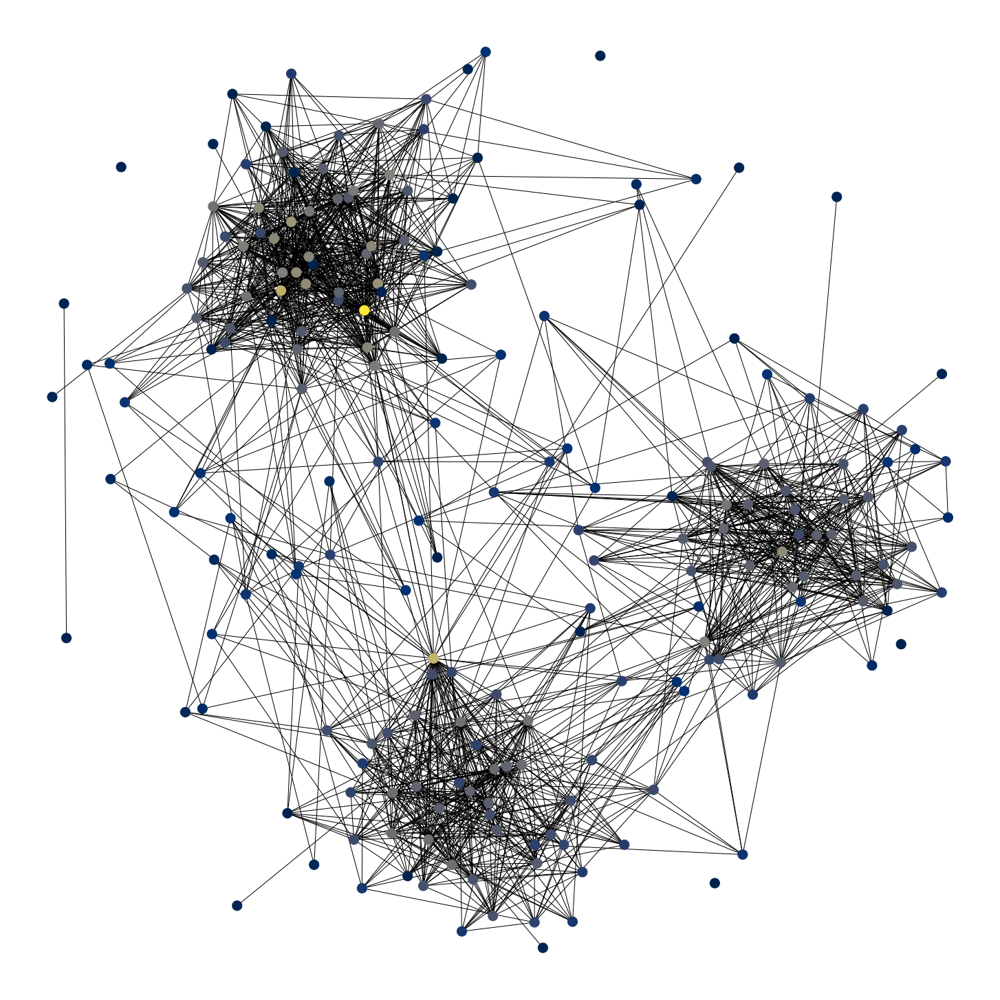

In [13]:
import time
from tqdm import tqdm
import requests
import networkx as nx
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D


class Users:

    @staticmethod
    def get_sexes(users_info):
        return [info.get("sex") for info in users_info]

    @staticmethod
    def get_cities(users_info):
        res = list()
        for info in users_info:
            if info.get("city"):
                res.append(info["city"].get("id"))
            else:
                res.append(None)
        return res

    @staticmethod
    def get_universities(users_info):
        return [info.get("university_name") for info in users_info]

    @staticmethod
    def get_schools(users_info):
        res = list()
        for info in users_info:
            if info.get("schools"):
                res.append(info["schools"][-1].get("id"))
            else:
                res.append(None)
        return res

class InfoGetter:

    def __init__(self, user_id, token, fields):
        self.user_id = user_id
        self.token = token
        self.fields = fields

    def get_friends_info(self):
        return requests.post(f"https://api.vk.com/method/friends.get?user_id={self.user_id}&access_token={self.token}&fields={self.fields}&v=5.124").json()["response"]["items"]

    def get_friends(self):
        return requests.post(f"https://api.vk.com/method/friends.get?user_id={self.user_id}&access_token={self.token}&v=5.124").json()["response"]["items"]

    def get_adjunct_matrix(self, friends):
        adjunct_matrix = np.zeros((len(friends), len(friends)))

        last_time = time.time()
        req_completed = 0
        
        print(f"{len(friends)} friends found")
        
        for i, friend_id in tqdm(enumerate(friends)):
            req = requests.post(f"https://api.vk.com/method/friends.get?user_id={friend_id}&access_token={self.token}&v=5.124").json()
            req_completed += 1

            if req.get("response") is not None and req["response"].get("items") is not None:
                cur_friends = set(req["response"]["items"])
            else:
                continue

            for j, friend_id_j in enumerate(friends):
                if friend_id_j in cur_friends:
                    adjunct_matrix[i, j] = 1

            # Limits and recommendations
            # There can be maximum 3 requests to API methods per second from a client.
            if req_completed >= 3:
                while time.time() - last_time <= 1:
                    time.sleep(0.1)
                req_completed = 0
                last_time = time.time()

        return adjunct_matrix

FIG_SIZE = 20
EDGE_WIDTH = 1
NODE_SIZE = 200

def show_plt_with_params(graph, pos, params, select_params):
    color_map = plt.cm.rainbow
    plt.figure(figsize=(FIG_SIZE, FIG_SIZE))
    node_color = [param in select_params for param in params]
    nx.draw(graph, pos=pos, node_color=node_color, cmap=color_map, width=EDGE_WIDTH, node_size=NODE_SIZE)
    plt.show()

def main():
    token = "------"
    user_id = "------"
    fields = "sex,city,country,education,schools,universities"
    info_getter = InfoGetter(user_id, token, fields)

    friends_info = info_getter.get_friends_info()
    friends = info_getter.get_friends()

    sexes = Users.get_sexes(friends_info)
    cities = Users.get_cities(friends_info)
    universities = Users.get_universities(friends_info)
    schools = Users.get_schools(friends_info)

    adjunct_matrix = info_getter.get_adjunct_matrix(friends)


    graph = nx.from_numpy_array(adjunct_matrix)
    pos = nx.spring_layout(graph, k=0.6, seed=0)

    color_map = plt.cm.rainbow
    plt.figure(figsize=(FIG_SIZE, FIG_SIZE))
    nx.draw(graph, pos=pos, node_color=sexes, vmin=0, cmap=color_map, width=EDGE_WIDTH, node_size=NODE_SIZE)

    custom_lines = [Line2D([0], [0], color=color_map(0.5), lw=0, marker='o'),
                    Line2D([0], [0], color=color_map(1.0), lw=0, marker='o'),]
#     plt.legend(custom_lines, ['Women', 'Men'], fontsize="30")
    plt.show()
    
#     show_plt_with_params(graph, pos, cities, (49, 1573))
    show_plt_with_params(graph, pos, cities, (2,))
    show_plt_with_params(graph, pos, universities, ("СПбГУ",))
    show_plt_with_params(graph, pos, schools, ("54",))
    show_plt_with_params(graph, pos, schools, ("12",))
    show_plt_with_params(graph, pos, schools, ("23544",))

    colors = [0] * len(graph.edges)
    graph1 = graph.copy()
    colors1 = list()
    for k, (i, j) in enumerate(graph.edges):
        if sexes[i] == sexes[j]:
            colors[k] += 1
        if None not in (cities[i], cities[j]) and cities[i] == cities[j]:
            colors[k] += 1
        if None not in (universities[i], universities[j]) and universities[i] == universities[j]:
            colors[k] += 1
        if None not in (schools[i], schools[j]) and schools[i] == schools[j]:
            colors[k] += 1

        if colors[k] == 0:
            graph1.remove_edge(i, j)
        else:
            colors1.append(colors[k])

    color_map = plt.cm.YlOrRd
    plt.figure(figsize=(FIG_SIZE, FIG_SIZE))
    nx.draw(graph1, pos=pos, node_color=[1] * len(friends), vmin=0, vmax=1, edge_color=colors1,
            edge_cmap=color_map, cmap=color_map, edge_vmin=0, edge_vmax=4, width=EDGE_WIDTH, node_size=NODE_SIZE)
    custom_lines = [Line2D([0], [0], color=color_map(0.25), lw=4),
                    Line2D([0], [0], color=color_map(0.50), lw=4),
                    Line2D([0], [0], color=color_map(0.75), lw=4)]
#     plt.legend(custom_lines, ['Multiplicity = 1', 'Multiplicity = 2', 'Multiplicity = 3'], fontsize="30")
    plt.show()

    colors = [0] * len(friends)
    for i in range(len(friends)):
        d = 0
        for j in range(len(friends)):
            if adjunct_matrix[i,j] == 0:
                d += 2
            else:
                d += 1
        colors[i] = (len(friends) - 1) / d

    color_map = plt.cm.cividis
    plt.figure(figsize=(FIG_SIZE, FIG_SIZE))
    nx.draw(graph, pos=pos, node_color=colors, cmap=color_map, width=EDGE_WIDTH, node_size=NODE_SIZE)
    custom_lines = [Line2D([0], [0], color=color_map(0.0), lw=0, marker='o'),
                    Line2D([0], [0], color=color_map(0.5), lw=0, marker='o'),
                    Line2D([0], [0], color=color_map(1.0), lw=0, marker='o')]


    rnd = lambda x: f"{x:.2f}"
#     plt.legend(custom_lines, [rnd(min(colors)), rnd((min(colors) + max(colors)) / 2), rnd(max(colors)) ], fontsize="30")
    plt.show()

if __name__ == '__main__':
    main()
